In [82]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, precision_score, recall_score, f1_score
from sklearn.model_selection import GridSearchCV
import joblib

# Preparation of the data set






In [83]:
# Load train and test datasets

train_data_80 = pd.read_csv("/content/churn-bigml-80.csv")
test_data_20 = pd.read_csv("/content/churn-bigml-20.csv")

In [84]:
# Concatenate train and test datasets

full_data = pd.concat([train_data_80, test_data_20])
df = full_data.copy()

In [85]:
# Display the first few rows of the dataset

df.head(3)

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False


In [86]:
# Let's look at column names
df.columns

Index(['State', 'Account length', 'Area code', 'International plan',
       'Voice mail plan', 'Number vmail messages', 'Total day minutes',
       'Total day calls', 'Total day charge', 'Total eve minutes',
       'Total eve calls', 'Total eve charge', 'Total night minutes',
       'Total night calls', 'Total night charge', 'Total intl minutes',
       'Total intl calls', 'Total intl charge', 'Customer service calls',
       'Churn'],
      dtype='object')

In [87]:
# We make column names more writable
df.columns = ['state', 'account_lenght', 'area_code', 'international_plan',
              'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
              'total_day_calls', 'total_day_charge', 'total_eve_minutes',
              'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
              'total_night_calls', 'total_night_charge', 'total_intl_minutes',
              'total_intl_calls', 'total_intl_charge', 'number_customer_service_calls',
              'churn']

In [88]:
df.head(3)

,state,account_lenght,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False


In [89]:
# General view of data
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3333 entries, 0 to 666
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          3333 non-null   object 
 1   account_lenght                 3333 non-null   int64  
 2   area_code                      3333 non-null   int64  
 3   international_plan             3333 non-null   object 
 4   voice_mail_plan                3333 non-null   object 
 5   number_vmail_messages          3333 non-null   int64  
 6   total_day_minutes              3333 non-null   float64
 7   total_day_calls                3333 non-null   int64  
 8   total_day_charge               3333 non-null   float64
 9   total_eve_minutes              3333 non-null   float64
 10  total_eve_calls                3333 non-null   int64  
 11  total_eve_charge               3333 non-null   float64
 12  total_night_minutes            3333 non-null   float64

In [90]:
# Check for missing values
df.isnull().sum().sum()

0

In [91]:
# Basic statistics
df.describe().T

,count,mean,std,min,25%,50%,75%,max
account_lenght,3333.0,101.064806,39.822106,1.00,74.00,101.00,127.00,243.00
area_code,3333.0,437.182418,42.371290,408.00,408.00,415.00,510.00,510.00
number_vmail_messages,3333.0,8.099010,13.688365,0.00,0.00,0.00,20.00,51.00
total_day_minutes,3333.0,179.775098,54.467389,0.00,143.70,179.40,216.40,350.80
total_day_calls,3333.0,100.435644,20.069084,0.00,87.00,101.00,114.00,165.00
total_day_charge,3333.0,30.562307,9.259435,0.00,24.43,30.50,36.79,59.64
total_eve_minutes,3333.0,200.980348,50.713844,0.00,166.60,201.40,235.30,363.70
total_eve_calls,3333.0,100.114311,19.922625,0.00,87.00,100.00,114.00,170.00
total_eve_charge,3333.0,17.083540,4.310668,0.00,14.16,17.12,20.00,30.91
total_night_minutes,3333.0,200.872037,50.573847,23.20,167.00,201.20,235.30,395.00


In [92]:
# Data types and unique values
print(f"\nD-TYPES: \n{df.dtypes}")
print(f"\nUNIQUE VALUES: \n{df.nunique()}")


D-TYPES: 
state                             object
account_lenght                     int64
area_code                          int64
international_plan                object
voice_mail_plan                   object
number_vmail_messages              int64
total_day_minutes                float64
total_day_calls                    int64
total_day_charge                 float64
total_eve_minutes                float64
total_eve_calls                    int64
total_eve_charge                 float64
total_night_minutes              float64
total_night_calls                  int64
total_night_charge               float64
total_intl_minutes               float64
total_intl_calls                   int64
total_intl_charge                float64
number_customer_service_calls      int64
churn                               bool
dtype: object

UNIQUE VALUES: 
state                              51
account_lenght                    212
area_code                           3
international_plan      

Let's look at the categorical columns

In [93]:
df.state.unique()

array(['KS', 'OH', 'NJ', 'OK', 'AL', 'MA', 'MO', 'WV', 'RI', 'IA', 'MT',
       'ID', 'VT', 'VA', 'TX', 'FL', 'CO', 'AZ', 'NE', 'WY', 'IL', 'NH',
       'LA', 'GA', 'AK', 'MD', 'AR', 'WI', 'OR', 'DE', 'IN', 'UT', 'CA',
       'SD', 'NC', 'WA', 'MN', 'NM', 'NV', 'DC', 'NY', 'KY', 'ME', 'MS',
       'MI', 'SC', 'TN', 'PA', 'HI', 'ND', 'CT'], dtype=object)

In [94]:
df.voice_mail_plan.value_counts()

voice_mail_plan
No     2411
Yes     922
Name: count, dtype: int64

In [95]:
df.international_plan.value_counts()

international_plan
No     3010
Yes     323
Name: count, dtype: int64

In [96]:
# Encode categorical columns
df['international_plan'] = df['international_plan'].apply(lambda x: True if x == 'Yes' else False)
df['voice_mail_plan'] = df['voice_mail_plan'].apply(lambda x: True if x == 'Yes' else False)


In [97]:
df["area_code"].unique()

array([415, 408, 510])

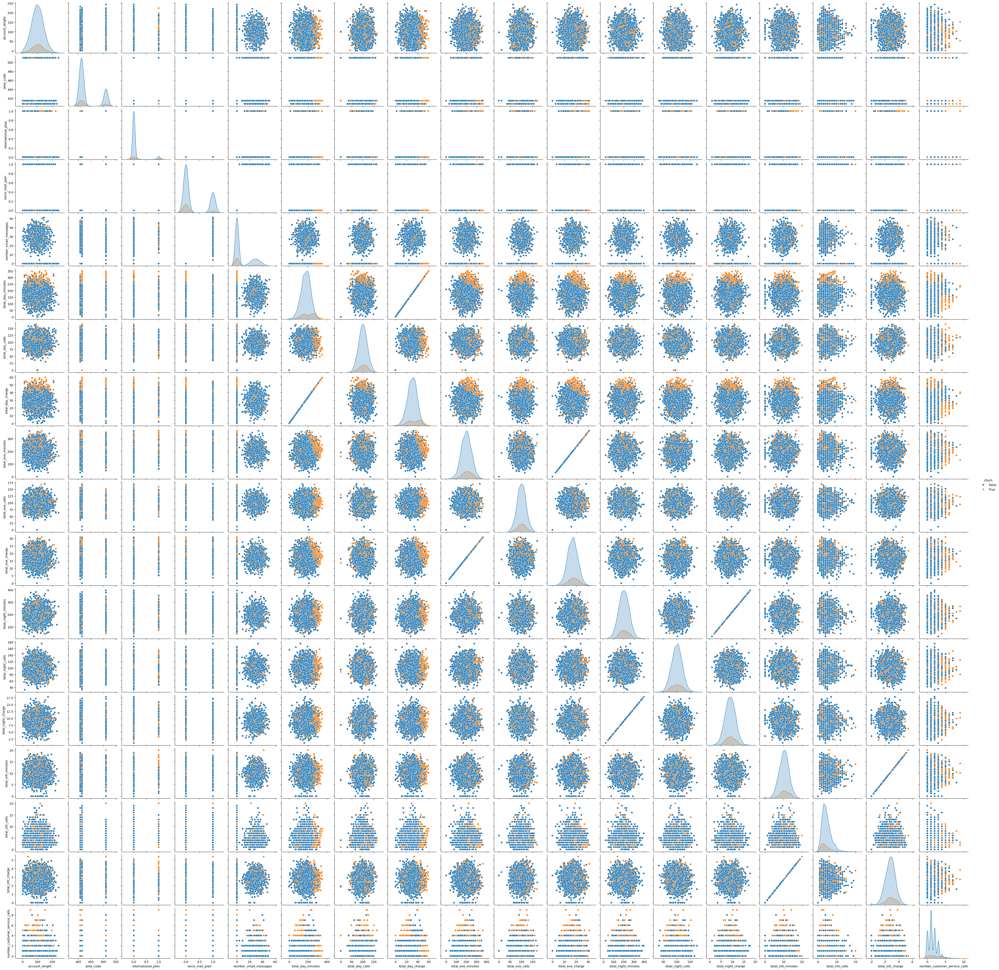

In [98]:
sns.pairplot(df , hue ='churn')

# Implement feature engineering and selection techniques

In [109]:
df.columns

Index(['state', 'account_lenght', 'area_code', 'international_plan',
       'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'churn', 'average_call_duration',
       'total_charge', 'total_calls', 'total_minutes', 'service_usage'],
      dtype='object')

In [110]:
# Creating new features
df['average_call_duration'] = (df['total_day_minutes'] + df['total_eve_minutes'] + df['total_night_minutes']) / (df['total_day_calls'] + df['total_eve_calls'] + df['total_night_calls'])
df['total_charge'] = df['total_day_charge'] + df['total_eve_charge'] + df['total_night_charge'] + df['total_intl_charge']
df['total_calls'] = df['total_day_calls'] + df['total_eve_calls'] + df['total_night_calls'] + df['total_intl_calls']
df['total_minutes'] =df['total_day_minutes']+df['total_eve_minutes']+df['total_night_minutes']+df['total_intl_minutes']
df['service_usage'] = df['number_vmail_messages'] + df['total_day_minutes'] + df['total_eve_minutes'] + df['total_night_minutes'] + df['total_intl_minutes']


In [111]:
df.head()

,state,account_lenght,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,...,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn,average_call_duration,total_charge,total_calls,total_minutes,service_usage
0,KS,128,415,False,True,25,265.1,110,45.07,197.4,...,10.0,3,2.70,1,False,2.357333,75.56,303,717.2,742.2
1,OH,107,415,False,True,26,161.6,123,27.47,195.5,...,13.7,3,3.70,1,False,1.858663,59.24,332,625.2,651.2
2,NJ,137,415,False,False,0,243.4,114,41.38,121.2,...,12.2,5,3.29,0,False,1.607317,62.29,333,539.4,539.4
3,OH,84,408,True,False,0,299.4,71,50.90,61.9,...,6.6,7,1.78,2,False,2.250806,66.80,255,564.8,564.8
4,OK,75,415,True,False,0,166.7,113,28.34,148.3,...,10.1,3,2.73,3,False,1.409831,52.09,359,512.0,512.0


average_call_duration




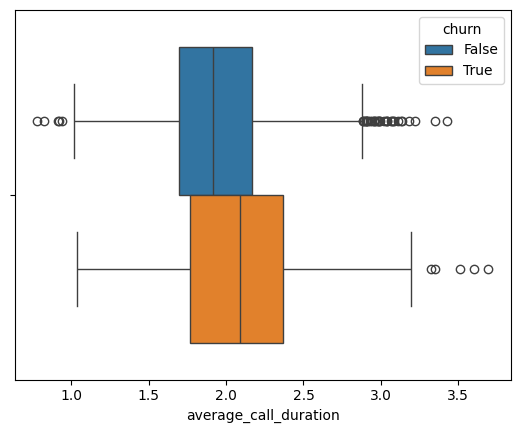



total_charge




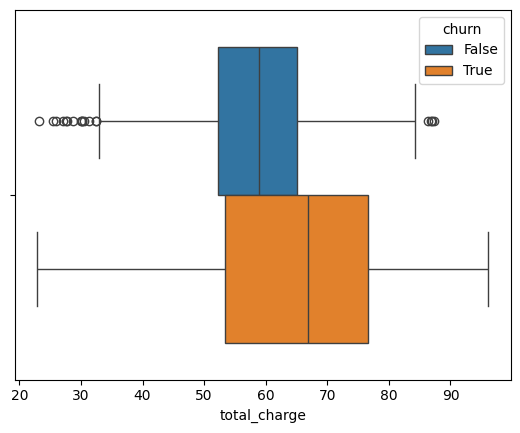



total_calls




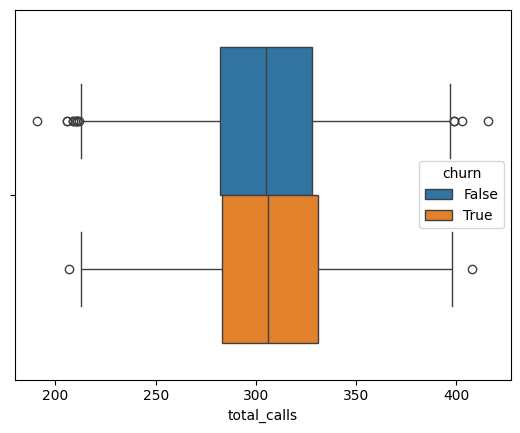



total_minutes




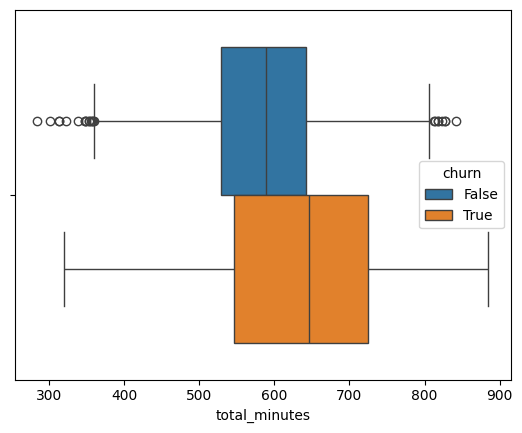



service_usage




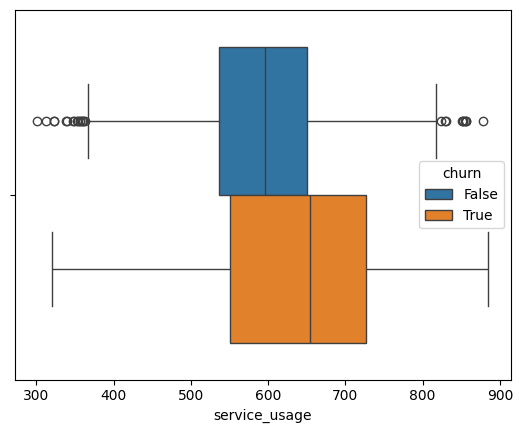

In [112]:
#  visualize the distribution of different columns according to churn
for col in df[['average_call_duration', 'total_charge', 'total_calls', 'total_minutes', 'service_usage']]:
    print(f'{col}')
    print('\n')
    sns.boxplot(data=df, x=col, hue ='churn')
    plt.show()
    print('\n')

In [113]:
df.head(2)

,state,account_lenght,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,...,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn,average_call_duration,total_charge,total_calls,total_minutes,service_usage
0,KS,128,415,False,True,25,265.1,110,45.07,197.4,...,10.0,3,2.7,1,False,2.357333,75.56,303,717.2,742.2
1,OH,107,415,False,True,26,161.6,123,27.47,195.5,...,13.7,3,3.7,1,False,1.858663,59.24,332,625.2,651.2


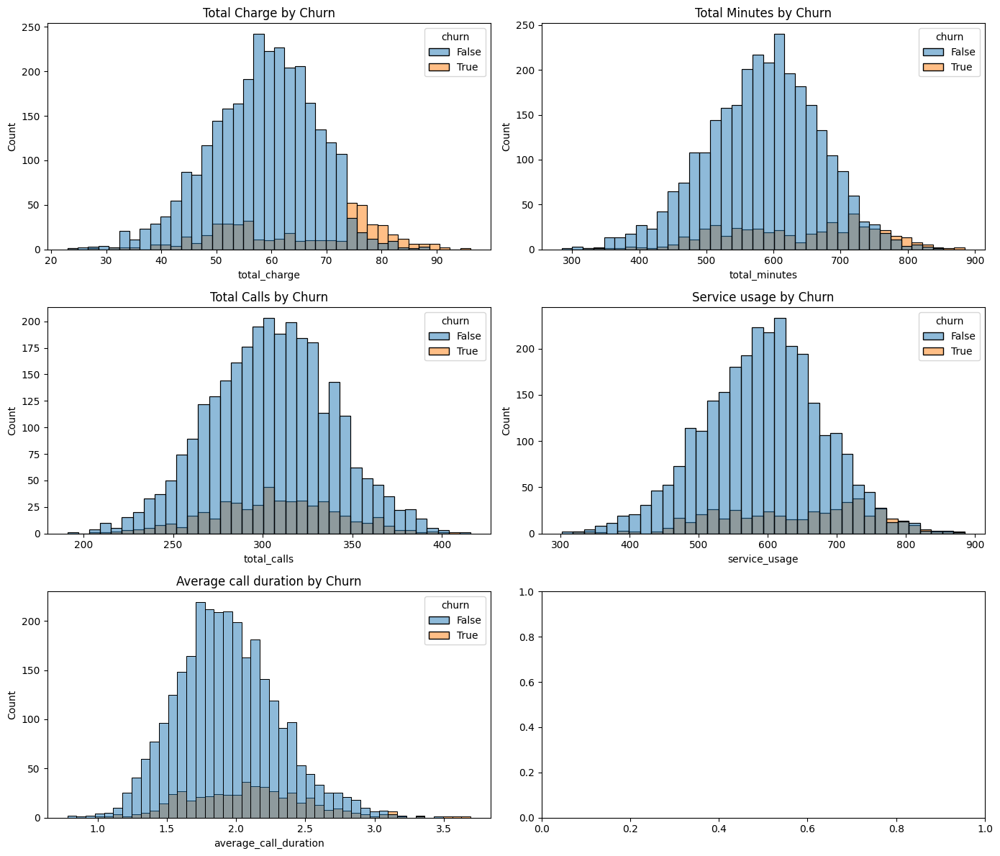

In [114]:
# Visualize the distribution of the total_charge column according to the state of churn

fig, axes = plt.subplots(3, 2, figsize=(14, 12))


sns.histplot(data=df, x='total_charge', hue='churn', ax=axes[0, 0])
axes[0, 0].set_title('Total Charge by Churn')


sns.histplot(data=df, x='total_minutes', hue='churn', ax=axes[0, 1])
axes[0, 1].set_title('Total Minutes by Churn')


sns.histplot(data=df, x='total_calls', hue='churn', ax=axes[1, 0])
axes[1, 0].set_title('Total Calls by Churn')

sns.histplot(data=df, x='service_usage', hue='churn', ax=axes[1, 1])
axes[1, 1].set_title('Service usage by Churn')

sns.histplot(data=df, x='average_call_duration', hue='churn', ax=axes[2, 0])
axes[2, 0].set_title('Average call duration by Churn')



plt.tight_layout()


plt.show()

In [115]:
df2 = df[df['total_charge'] > 75]
df2['churn'].value_counts()


churn
True     174
False     60
Name: count, dtype: int64

In [116]:
df2 = df[df['total_charge'] < 75]
df2['churn'].value_counts()

churn
False    2790
True      309
Name: count, dtype: int64

It appears that when customers' daily charges exceed 75, their likelihood of churning increases

In [117]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3333 entries, 0 to 666
Data columns (total 25 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          3333 non-null   object 
 1   account_lenght                 3333 non-null   int64  
 2   area_code                      3333 non-null   int64  
 3   international_plan             3333 non-null   bool   
 4   voice_mail_plan                3333 non-null   bool   
 5   number_vmail_messages          3333 non-null   int64  
 6   total_day_minutes              3333 non-null   float64
 7   total_day_calls                3333 non-null   int64  
 8   total_day_charge               3333 non-null   float64
 9   total_eve_minutes              3333 non-null   float64
 10  total_eve_calls                3333 non-null   int64  
 11  total_eve_charge               3333 non-null   float64
 12  total_night_minutes            3333 non-null   float64

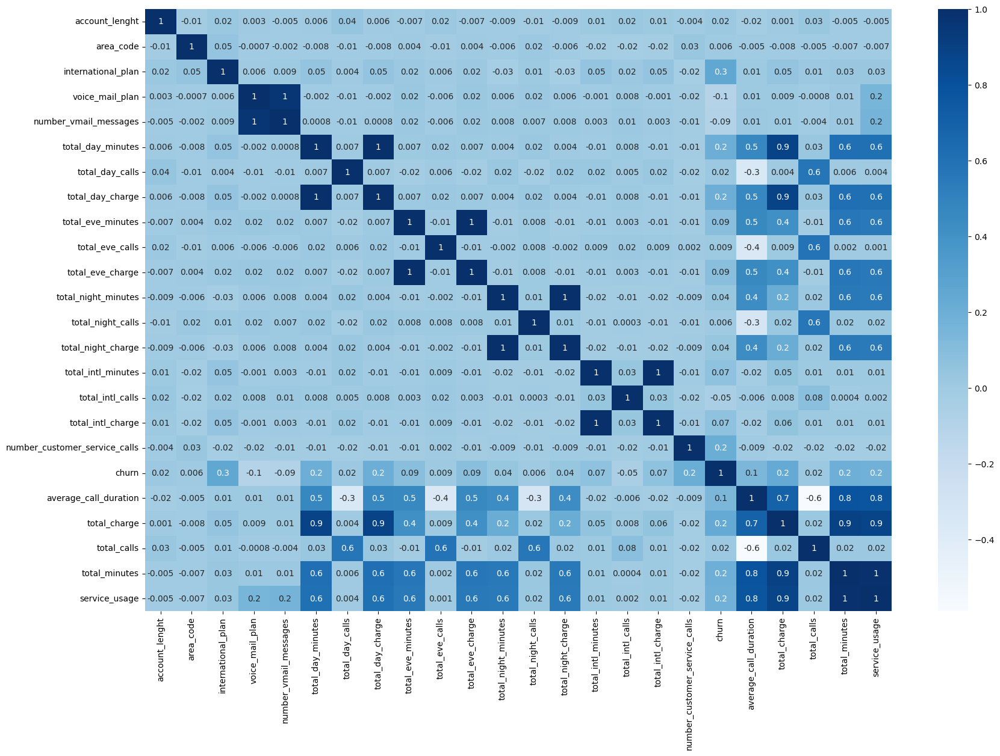

In [118]:
plt.figure(figsize=(20,13))
sns.heatmap(df.select_dtypes(exclude=['object']).corr() , cmap = 'Blues' , annot= True , fmt = '.1g')

plt.show()

In [119]:
df.columns

Index(['state', 'account_lenght', 'area_code', 'international_plan',
       'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'churn', 'average_call_duration',
       'total_charge', 'total_calls', 'total_minutes', 'service_usage'],
      dtype='object')

In [120]:
df.drop(['state','total_day_minutes','total_day_calls','total_day_charge','total_eve_minutes','total_eve_calls','total_eve_charge',
         'total_night_minutes','total_night_calls','total_night_charge','total_intl_minutes','total_intl_calls','total_intl_charge'],axis=1,inplace=True)

In [121]:
df.head()

,account_lenght,area_code,international_plan,voice_mail_plan,number_vmail_messages,number_customer_service_calls,churn,average_call_duration,total_charge,total_calls,total_minutes,service_usage
0,128,415,False,True,25,1,False,2.357333,75.56,303,717.2,742.2
1,107,415,False,True,26,1,False,1.858663,59.24,332,625.2,651.2
2,137,415,False,False,0,0,False,1.607317,62.29,333,539.4,539.4
3,84,408,True,False,0,2,False,2.250806,66.80,255,564.8,564.8
4,75,415,True,False,0,3,False,1.409831,52.09,359,512.0,512.0


In [122]:
df.corr()

,account_lenght,area_code,international_plan,voice_mail_plan,number_vmail_messages,number_customer_service_calls,churn,average_call_duration,total_charge,total_calls,total_minutes,service_usage
account_lenght,1.000000,-0.012463,0.024735,0.002918,-0.004628,-0.003796,0.016541,-0.021626,0.001454,0.027542,-0.004785,-0.005415
area_code,-0.012463,1.000000,0.048551,-0.000747,-0.001994,0.027572,0.006174,-0.004841,-0.008393,-0.004836,-0.006828,-0.007035
international_plan,0.024735,0.048551,1.000000,0.006006,0.008745,-0.024522,0.259852,0.012397,0.048415,0.014037,0.025850,0.026813
voice_mail_plan,0.002918,-0.000747,0.006006,1.000000,0.956927,-0.017824,-0.102148,0.011512,0.008585,-0.000807,0.014503,0.157950
number_vmail_messages,-0.004628,-0.001994,0.008745,0.956927,1.000000,-0.013263,-0.089728,0.013731,0.009766,-0.003911,0.014779,0.164688
number_customer_service_calls,-0.003796,0.027572,-0.024522,-0.017824,-0.013263,1.000000,0.208750,-0.008975,-0.019873,-0.018161,-0.020969,-0.022676
churn,0.016541,0.006174,0.259852,-0.102148,-0.089728,0.208750,1.000000,0.141012,0.231549,0.015807,0.198607,0.182448
average_call_duration,-0.021626,-0.004841,0.012397,0.011512,0.013731,-0.008975,0.141012,1.000000,0.693803,-0.589026,0.784020,0.775461
total_charge,0.001454,-0.008393,0.048415,0.008585,0.009766,-0.019873,0.231549,0.693803,1.000000,0.022225,0.890804,0.880203
total_calls,0.027542,-0.004836,0.014037,-0.000807,-0.003911,-0.018161,0.015807,-0.589026,0.022225,1.000000,0.018204,0.017371


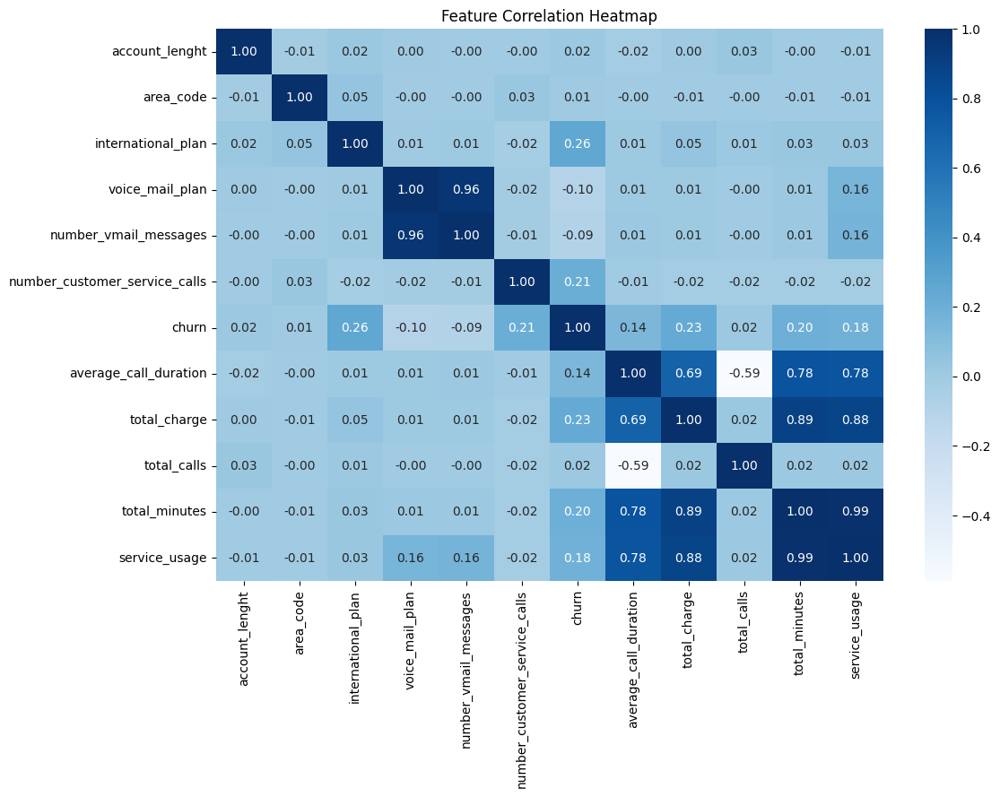

In [123]:
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, fmt='.2f', cmap='Blues')
plt.title('Feature Correlation Heatmap')
plt.show()

In [124]:
# Properties and target variable separation

y = df['churn']
X = df.drop('churn', axis=1)

In [125]:
# Separation into training and testing sets

x_train, x_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=140)

In [126]:
# Train models
logistic_regression = LogisticRegression(max_iter=1000)
random_forest = RandomForestClassifier()
xgboost = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

In [127]:
# Create LogisticRegression and train models
log = LogisticRegression(penalty='l2', solver='lbfgs', max_iter=200)
log_model = log.fit(x_train, y_train)

In [134]:
# Create Random Forest and train models
rf = RandomForestClassifier()
rf_model = rf.fit(x_train, y_train)

In [129]:
# Create XGBoost and train models
xgb = XGBClassifier(eval_metric='logloss')
xgb_model = xgb.fit(x_train, y_train)

In [131]:
# Save the Logistic Regression model
joblib.dump(log_model, '/content/log_model.joblib')

['/content/log_model.joblib']

In [135]:
# Save the Random Forest model
joblib.dump(rf_model, '/content/rf_model.joblib')

['/content/rf_model.joblib']

In [132]:
# Save the XGBoost model
joblib.dump(xgb_model, '/content/xgb_model.joblib')

['/content/xgb_model.joblib']

Train Score is 0.8604651162790697
Test Score is 0.8680659670164917
Precision: 0.525
Recall: 0.23333333333333334
F1-Score: 0.3230769230769231
              precision    recall  f1-score   support

       False       0.89      0.97      0.93       577
        True       0.53      0.23      0.32        90

    accuracy                           0.87       667
   macro avg       0.71      0.60      0.62       667
weighted avg       0.84      0.87      0.85       667



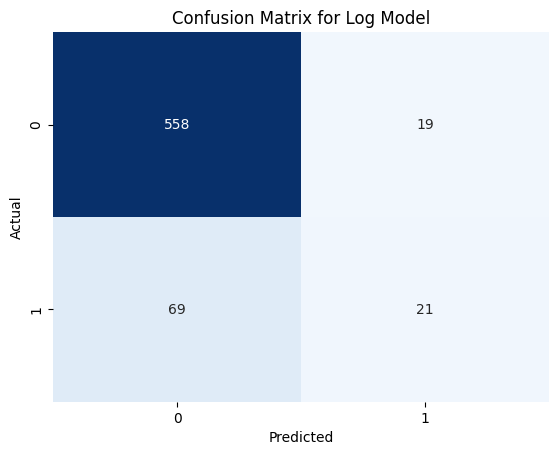

In [136]:
# Logistic Regression model predict
y_pred = log_model.predict(x_test)


train_accuracy = accuracy_score(y_train, log_model.predict(x_train))
test_accuracy = accuracy_score(y_test, y_pred)

print(f"Train Score is {train_accuracy}")
print(f"Test Score is {test_accuracy}")

# Precision, Recall and F1-Score calculation
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1-Score: {f1}')

report = classification_report(y_test, y_pred)
print(report)

# Confusion matrix creation and visualization
confusion_mat = confusion_matrix(y_test, y_pred)
sns.heatmap(confusion_mat, fmt='g', annot=True, cbar=False, vmin=0, cmap='Blues')
plt.title(f'Confusion Matrix for Log Model')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

Train Score is 1.0
Test Score is 0.9475262368815592
Precision: 0.8767123287671232
Recall: 0.7111111111111111
F1-Score: 0.7852760736196318
              precision    recall  f1-score   support

       False       0.96      0.98      0.97       577
        True       0.88      0.71      0.79        90

    accuracy                           0.95       667
   macro avg       0.92      0.85      0.88       667
weighted avg       0.95      0.95      0.95       667



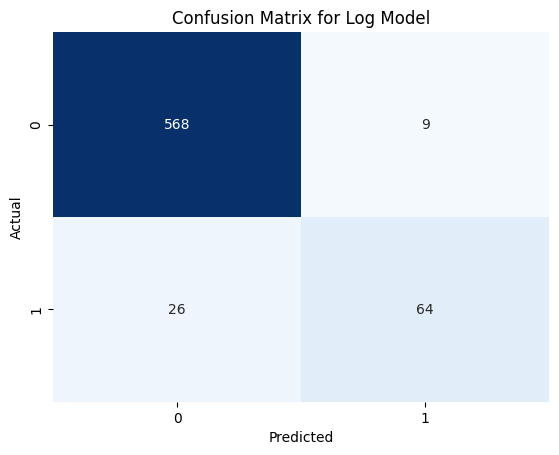

In [137]:
# Random Forest predict
y_pred = rf_model.predict(x_test)


train_accuracy = accuracy_score(y_train, rf_model.predict(x_train))
test_accuracy = accuracy_score(y_test, y_pred)

print(f"Train Score is {train_accuracy}")
print(f"Test Score is {test_accuracy}")

# Precision, Recall and F1-Score calculation
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1-Score: {f1}')

report = classification_report(y_test, y_pred)
print(report)

# Confusion matrix creation and visualization
confusion_mat = confusion_matrix(y_test, y_pred)
sns.heatmap(confusion_mat, fmt='g', annot=True, cbar=False, vmin=0, cmap='Blues')
plt.title(f'Confusion Matrix for Log Model')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

Train Score is 1.0
Test Score is 0.9340329835082459
Precision: 0.7738095238095238
Recall: 0.7222222222222222
F1-Score: 0.7471264367816092
              precision    recall  f1-score   support

       False       0.96      0.97      0.96       577
        True       0.77      0.72      0.75        90

    accuracy                           0.93       667
   macro avg       0.87      0.84      0.85       667
weighted avg       0.93      0.93      0.93       667



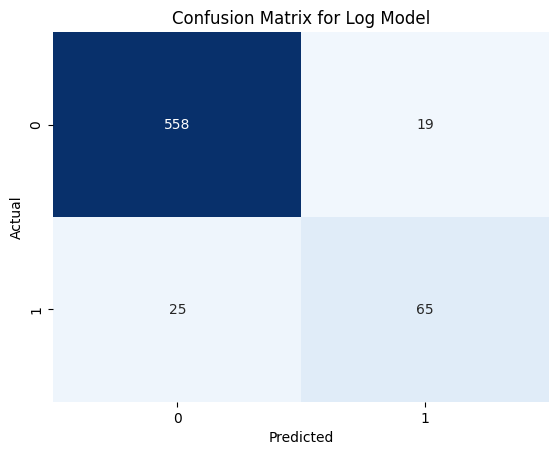

In [138]:
# XGBoost model predict
y_pred = xgb_model.predict(x_test)


train_accuracy = accuracy_score(y_train, xgb_model.predict(x_train))
test_accuracy = accuracy_score(y_test, y_pred)

print(f"Train Score is {train_accuracy}")
print(f"Test Score is {test_accuracy}")

# Precision, Recall and F1-Score calculation
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1-Score: {f1}')

report = classification_report(y_test, y_pred)
print(report)

# Confusion matrix creation and visualization
confusion_mat = confusion_matrix(y_test, y_pred)
sns.heatmap(confusion_mat, fmt='g', annot=True, cbar=False, vmin=0, cmap='Blues')
plt.title(f'Confusion Matrix for Log Model')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [139]:
# Hyperparameter tuning for Random Forest
param_grid_rf = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10]
}

grid_search_rf = GridSearchCV(RandomForestClassifier(), param_grid_rf, cv=3, scoring='accuracy')
grid_search_rf.fit(x_train, y_train)

print(f"Best parameters for Random Forest: {grid_search_rf.best_params_}")
print(f"Best score for Random Forest: {grid_search_rf.best_score_:.4f}")

# Hyperparameter tuning for XGBoost
param_grid_xgb = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7]
}

grid_search_xgb = GridSearchCV(XGBClassifier( eval_metric='logloss'), param_grid_xgb, cv=3, scoring='accuracy')
grid_search_xgb.fit(x_train, y_train)

print(f"Best parameters for XGBoost: {grid_search_xgb.best_params_}")
print(f"Best score for XGBoost: {grid_search_xgb.best_score_:.4f}")

Best parameters for Random Forest: {'max_depth': 10, 'min_samples_split': 10, 'n_estimators': 50}
Best score for Random Forest: 0.9482
Best parameters for XGBoost: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50}
Best score for XGBoost: 0.9490


In [141]:
# Assuming 'grid_search_rf' is your trained RandomForestClassifier
model = grid_search_rf.best_estimator_  # Assign the best model to 'model'
joblib.dump(model, '/content/churn_model.joblib')
print("Model saved successfully!")

Model saved successfully!


In [143]:
loaded_model = joblib.load('/content/churn_model.joblib')